### ASTR 8070: Astrostatistics
***S. R. Taylor***
___

# Homework 9
### Due: Saturday, Apr 24th at 11.59pm CDT
---

The first two homework problems this week are very subjective, and necessarily deal with some randomization in your solutions. Do your best to fully catalog your tests, checks, and thought process as you answer. 

## Problem 1


Go to the TensorFlow playground [here](https://playground.tensorflow.org/#activation=linear&regularization=L2&batchSize=10&dataset=xor&regDataset=reg-plane&learningRate=0.01&regularizationRate=0&noise=35&networkShape=1&seed=0.50246&showTestData=false&discretize=false&percTrainData=50&x=true&y=true&xTimesY=false&xSquared=false&ySquared=false&cosX=false&sinX=false&cosY=false&sinY=false&collectStats=false&problem=classification&initZero=false&hideText=false). You will play with the tensorflow neural network architecture there, and come back to answer the questions here.


1. The model as given combines two input features into a single neuron with a linear activation of form $f(x) = x$. Write down an equation that algebraically describes the output of this network, in terms of the synapse weights, the neuron bias, and the input data. Based on your equation, will this model learn any nonlinearities? Run the network to confirm your guess.

--------------
The output $o_1$ is given by:

\begin{align}
    o_k &= g\left(\Sigma_{j=1}^M w_{jk}f\left(\Sigma_{i=1}^2 w_{ij}x_i + b_j \right) + b_k \right) \\
        &= w^{(2)}\left(\Sigma_{i=1}^2 w_{i}^{(1)}x_i + b^{(1)} \right) + b^{(2)}
\end{align}

where $w_i^{(j)}$ are the synapse weights for the $i$-th input and $j$-th hidden layer, $x_i$ are the input data, and $b^{(k)}$ are the neuron biases for the $k$-th layer.

The equation will not learn any non-linearities because the equation is linear.

----------------

SRT: Excellent!

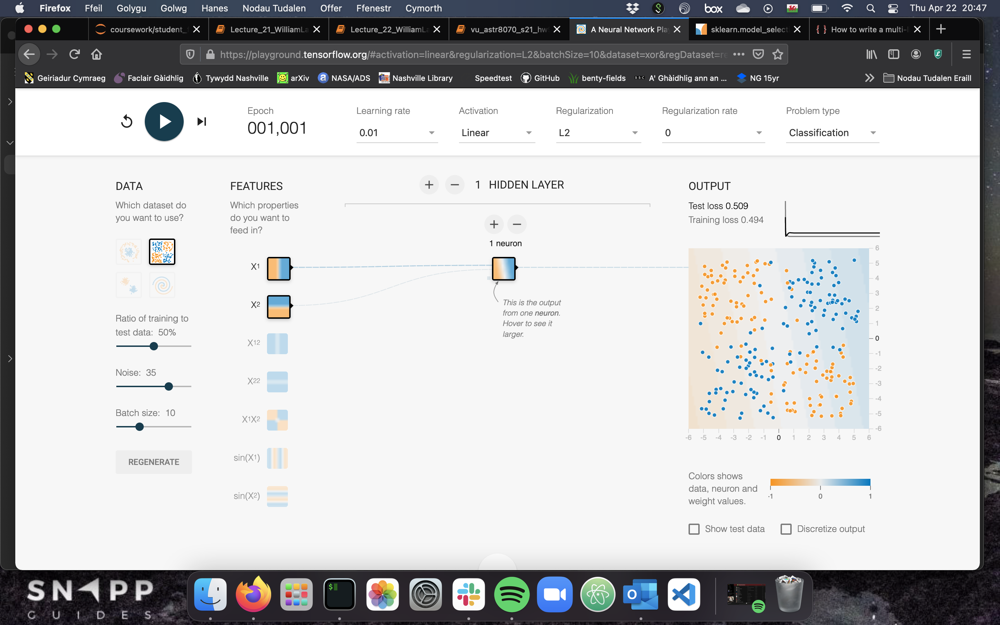

2. Try increasing the number of neurons in the hidden layer from 1 to 2, and also try changing from a Linear activation to a nonlinear activation like ReLU. Can you create a model that can learn nonlinearities? Can it model the data effectively? Check through multiple re-runs. *Note that you can hover over the neurons to see which features they are identifying.*

---
Using a sigmoid function and increasing the training-to-testing data ratio to 80% results in a better model, but it still isn't great. A tanh model gives similar results, but ReLU is very poor at this task. With less than 80% training data, neither activation function can get this close to modelling the data.

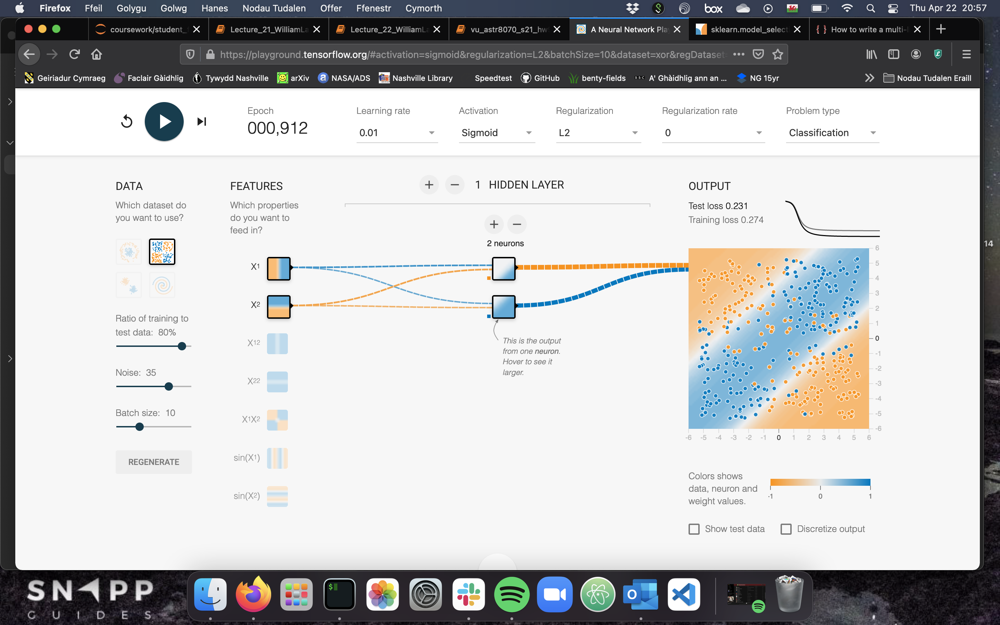

3. Try increasing the number of neurons in the hidden layer from 2 to 3, using a nonlinear activation like ReLU. Can it model the data effectively? How does model quality vary from run to run?

---
Using ReLU with 80% training ratio, the model varies from run to run. Sometimes, it models the data rather well, showing four regions of data. However sometimes, it looks like the model above with 2 neurons, where there is a centre diagonal region flanked by the other region on either side. It will also show this effect with 50% training ratio.

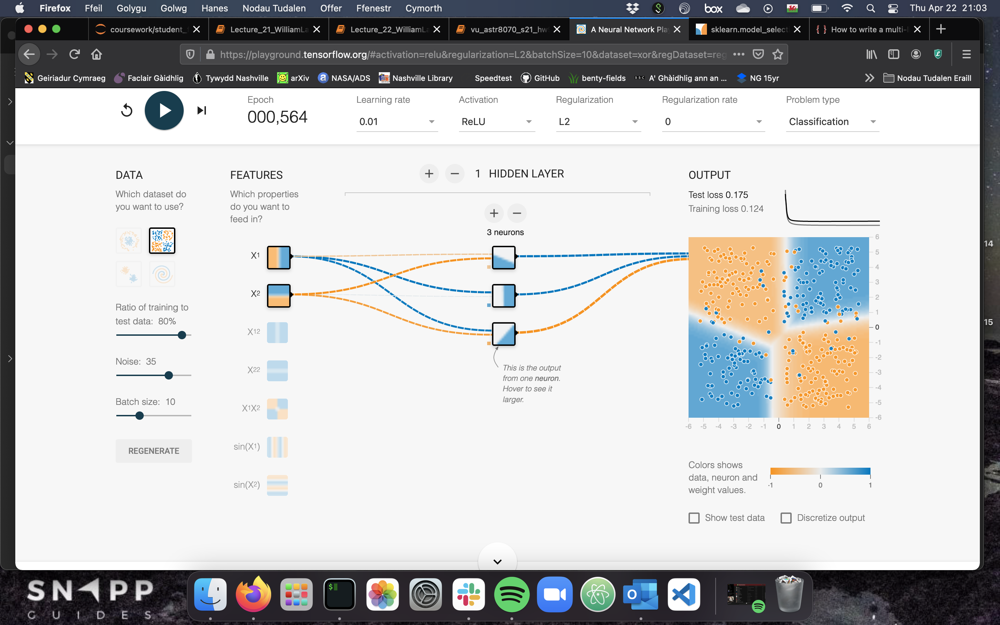

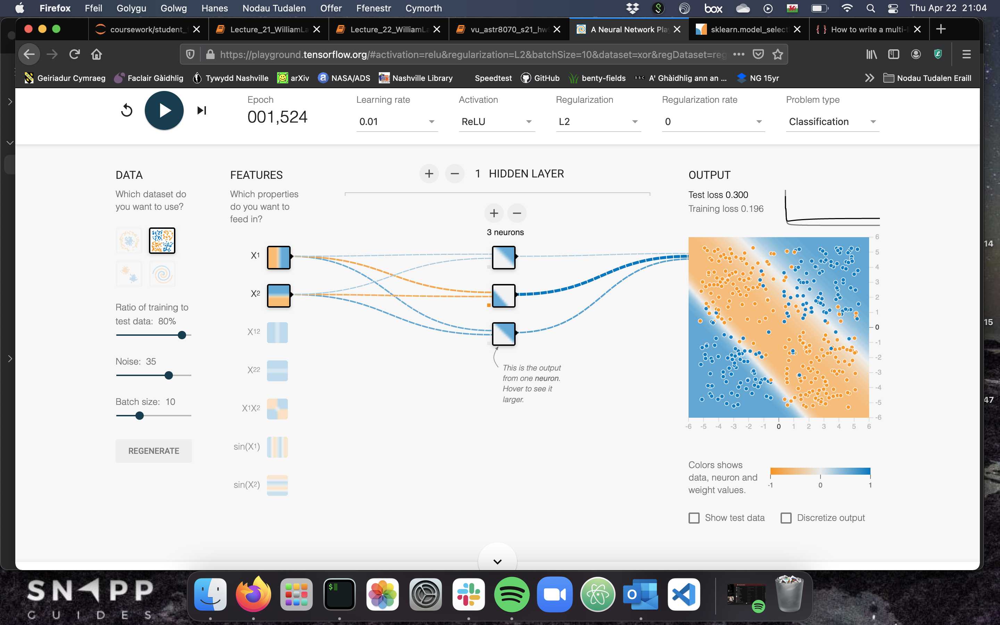

The sigmoid and ReLU also show this effect, although ReLU is very slow to reach an equilibrium compared to the other two activation functions.

4. Continue experimenting by adding or removing hidden layers and neurons per layer. Also feel free to change learning rates, regularization, and other learning settings. What is the smallest number of neurons and layers you can use that gives test loss of 0.177 or lower?

I find that the most reliable way of getting a test loss of <0.177 with the least number of hidden layers and neurons us with a tanh activation function, with 80% training data ratio, and 2 hidden layers. The first layer has 3 neurons, and the second has 2 neurons.

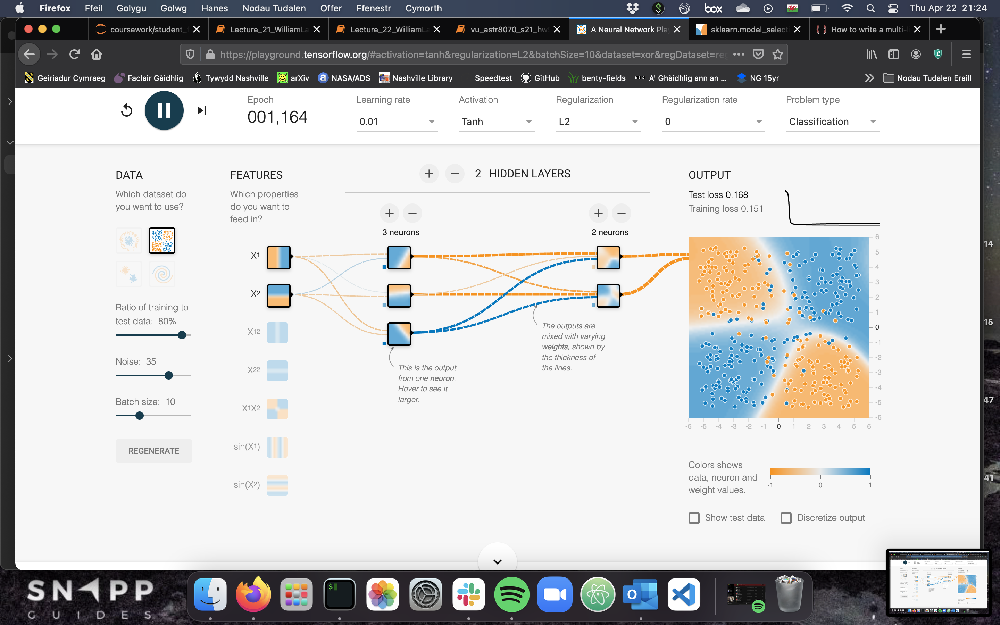

5. Does increasing the model size improve the fit, or how quickly it converges? Does this change how often it converges to a good model? For example, try the following architecture:

- First hidden layer with 3 neurons.
- Second hidden layer with 3 neurons.
- Third hidden layer with 2 neurons.

More complex model doesn't necessarily improve the fit or the speed of convergence. For example, the above architecture results in unstable boundaries. The category boundaries jitter and never reach a stable equilibrium for any activation function. This model performs worse than my model above.

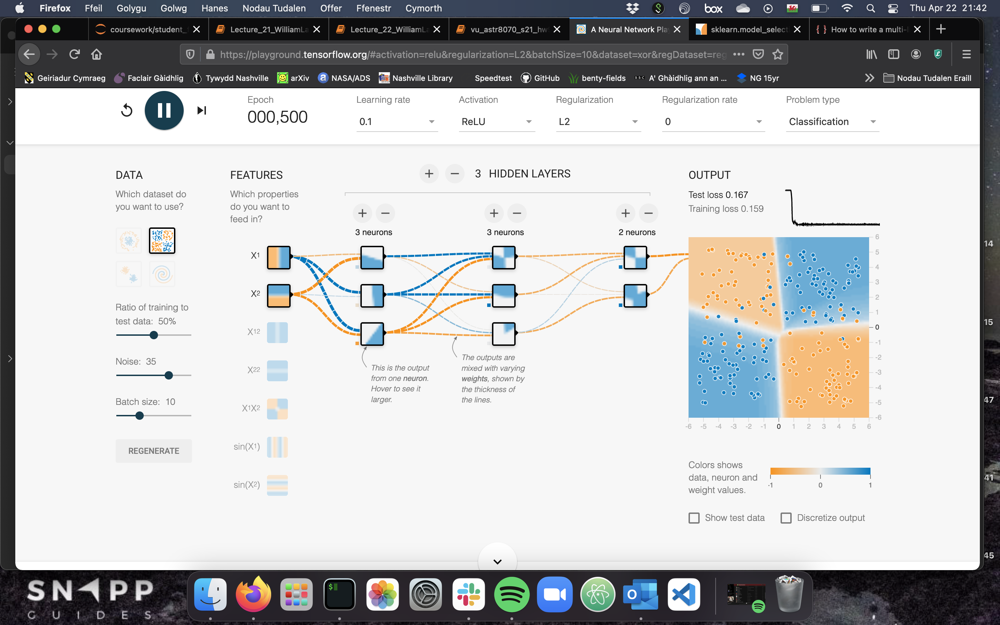

However, increasing the model complexity does appear to increase the number of times a model converges to a decent fit of the data.

SRT: Great! Pretty sure you got the test loss to be lower than mine.

## Problem 2


[This](https://playground.tensorflow.org/#activation=relu&regularization=L2&batchSize=10&dataset=spiral&regDataset=reg-plane&learningRate=0.1&regularizationRate=0.01&noise=50&networkShape=3,2&seed=0.65406&showTestData=false&discretize=false&percTrainData=50&x=true&y=true&xTimesY=false&xSquared=false&ySquared=false&cosX=false&sinX=false&cosY=false&sinY=false&collectStats=false&problem=classification&initZero=false&hideText=false) data set is a noisy spiral. Obviously, a linear model will fail here, but even manually defined feature combinations may be hard to construct.

1. Train the best model you can, using just X1 and X2. Add or remove layers and neurons as you see fit, change learning settings like learning rate, regularization rate, and batch size. What is the best test loss you can get? How smooth is the model output surface?

The best model I can train uses the following properties:
- hidden layers = 4
- 5 neurons in layers 1 and 2, 4 neurons in layer 3, 1 neuron in layer 4
- learning rate = 0.1
- regularisation = 0.001
- activation = ReLU
- batch size = 30
- training ratio = 80%

This model eventually settled down into an equilibrium, although it suffered from minor perturbations now and again. It wasn't very repeatable either...

The best test loss was 0.05 and output model surface was smooth on the bottom half of the spiral, but a bit jagged towards the centre of the spiral.

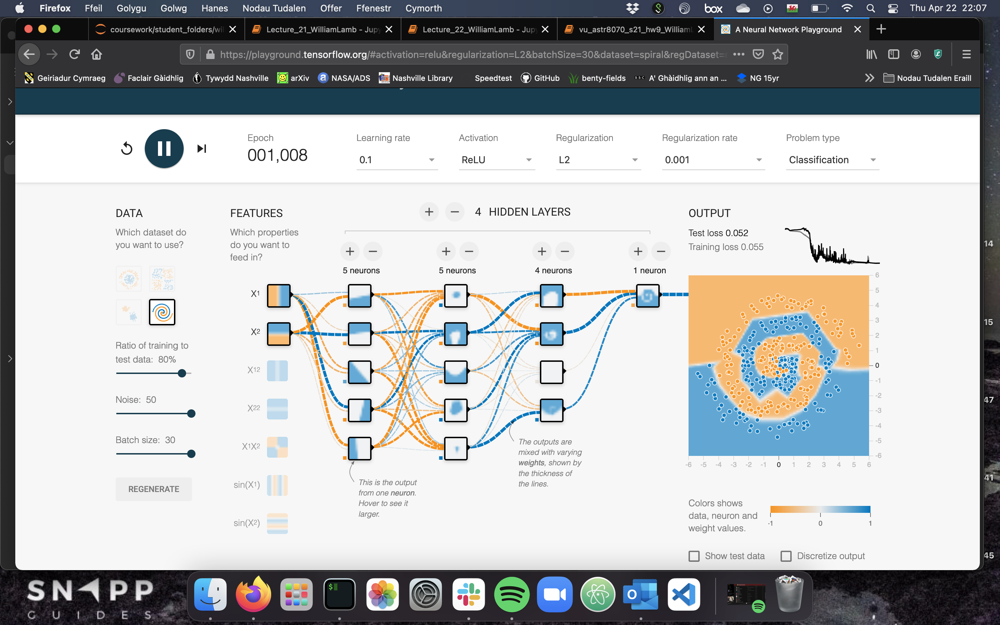

2. Even with Neural Nets, some amount of feature engineering is often needed to achieve best performance. Try adding in additional cross product features or other transformations like sin(X1) and sin(X2). Do you get a better model? Is the model output surface any smoother?

With cross product features, I'd expect the NN to improve. However, I couldn't improve on my effort above. I tried simplfying and complexifying the NN, and varying the other inputs, but I couldn't find a result that gave relaibly stable models with smoother features.

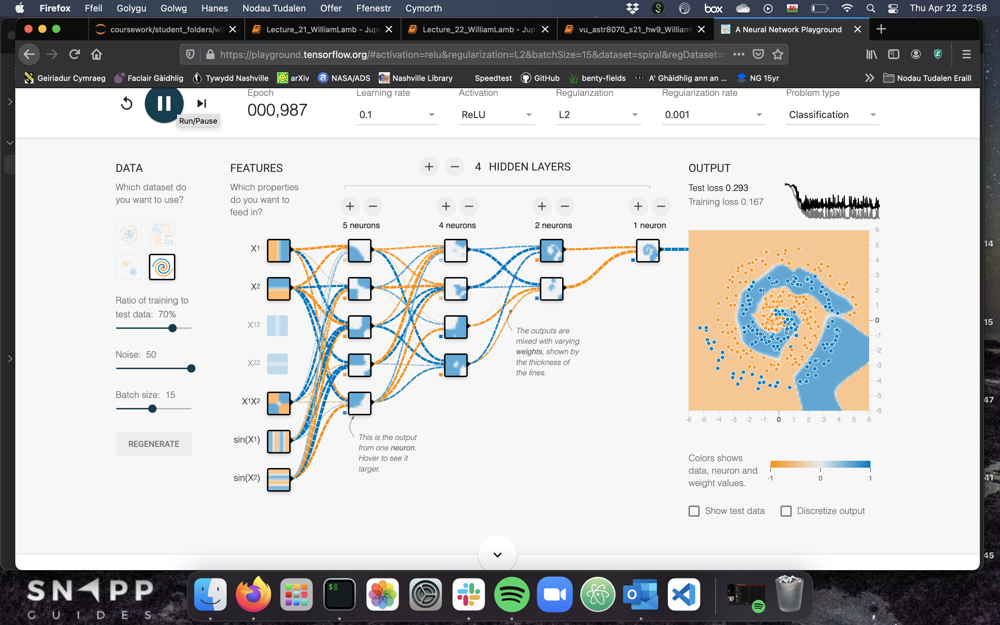

SRT: Excellent again, and great commentary.

## Problem 3

The first few steps of this problem are the same as last week's homework.


1. Use the following code snippet to read in SDSS galaxy color data.
```
from astroML.datasets import fetch_sdss_galaxy_colors
data = fetch_sdss_galaxy_colors()
```
Slice the data array to only take every other $10$th row. From this reduced data volume, create arrays of $(u-g)$, $(g-r)$, $(r-i)$, and $(i-z)$ colors. Also create arrays of redshift and the spectral class. 

In [1]:
# import important imports
import numpy as np
import matplotlib.pyplot as plt

# import dataset
from astroML.datasets import fetch_sdss_galaxy_colors
data = fetch_sdss_galaxy_colors()

# slicing data - every 10th row
data = data[::10]

# colour cuts
umg = data['u'] - data['g']
gmr = data['g'] - data['r']
rmi = data['r'] - data['i']
imz = data['i'] - data['z']

# arrays for redshift and specclass
rs = data['redshift']
sc = data['specClass']

2. We're going to make classification pretty tough for our deep neural network. Make a scatter plot of $(r-i)$ versus $(i-z)$, color coding by galaxy or quasar class. Notice how much more difficult the visual discrimination is compared to $(u-g)$ versus $(g-r)$. The plot should include appropriate axis labels and a legend.

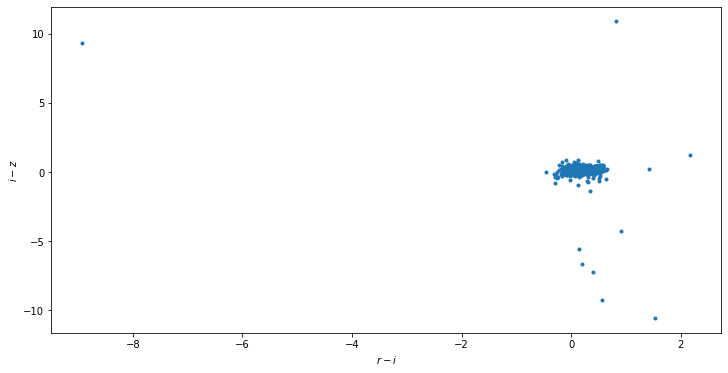

In [4]:
# use seaborn to plot
import seaborn as sns

plt.figure(figsize=(12,6))
sns.scatterplot(x=rmi, y=imz, hue=sc, alpha=0.75)
plt.xlabel(r'$r-i$')
plt.ylabel(r'$i-z$');

3. Stack the $(r-i)$ and $(i-z)$ colors into a data matrix, $X$. Create a target label array that has $0$ for a regular galaxy and $1$ for a quasar. Perform a train-test split, taking $20\%$ of the data for testing. Set the `random_state` in your train-test split to be `42` for reproducibility (and easy comparison with my solutions).

In [5]:
# creating data matrix (nsamps, nfeatures)
X = np.array([rmi, imz]).T
X.shape

(5000, 2)

In [6]:
# target array
y = np.unique(sc, return_inverse=True)[1]

In [7]:
# import test_train_split
from sklearn.model_selection import train_test_split

Xtrain, Xtest, ytrain, ytest = train_test_split(X, y,
                                                test_size=0.2,
                                                random_state=42)

4. Scale your training and testing data to prepare it for the DNN. 

In [8]:
# import scaling module
from sklearn import preprocessing

# scaling data
Xtrain_s = preprocessing.scale(Xtrain)
Xtest_s = preprocessing.scale(Xtest)

5. Train scikit-learn's multi-layer perceptron classifier with ReLU activation, stochastic gradient descent, two hidden layers of respective sizes of $5$ and $2$, and using `max_iter=1000`, and `random_state=42`. As with classifiers in last week's homework, plot an ROC curve that shows the network's performance on the scaled testing data. 

In [ ]:
# importing MLP
from sklearn.neural_network import MLPRegressor

# initiating MLP
mlp = MLPRegressor(activation='relu',
                   hidden_layer_sizes=(5,2),
                   solver='sgd', max_iter=1000,
                   random_state=42)
mlp.fit(Xtrain_s, ytrain) # fit scaled data

# prediciting using scaled test data
ypred = mlp.predict(Xtest_s)

SRT: Ouch, you used a regressor instead of a classifier. That's why your ROC curves show poorer than expected performance below. -3

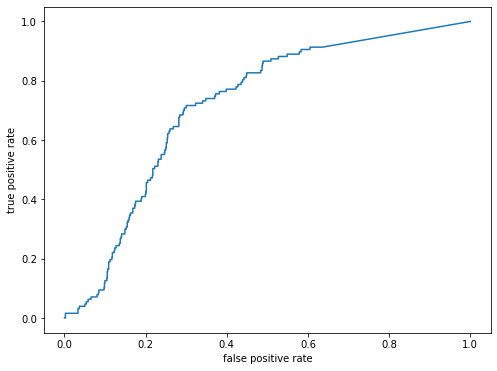

In [92]:
# importing roc module
from sklearn.metrics import roc_curve

# calculating rocs
fpr, tpr, thresholds = roc_curve(ytest, ypred)

plt.figure(figsize=(8,6))
plt.plot(fpr, tpr)
plt.xlabel('false positive rate')
plt.ylabel('true positive rate');

6. Now let's optimize the hyperparameters of your network. You will use `GridSearchCV` with the following hyperparameters for the network:

```
parameters = {'solver': ['lbfgs', 'sgd', 'adam'], 
              'hidden_layer_sizes': [(2,2), (5,5), (5,2), (5,5,5)], 
              'activation': ['relu', 'tanh'], 
              'random_state': [42], 'max_iter': [1000]}
```

Remember that you can utilize all availables cores on your machine with `n_jobs=-1`. Print out the classification score for the training data, and the best parameters obtained by the cross validation.

In [93]:
# import gridsearchcv
from sklearn.model_selection import GridSearchCV

# parameters to search over for optimisation
parameters = {'solver': ['lbfgs', 'sgd', 'adam'], 
              'hidden_layer_sizes': [(2,2), (5,5), (5,2), (5,5,5)], 
              'activation': ['relu', 'tanh'], 
              'random_state': [42], 'max_iter': [1000]}

# running optimiser
clf = GridSearchCV(MLPRegressor(), parameters, n_jobs=-1)
clf.fit(Xtrain_s, ytrain)

GridSearchCV(estimator=MLPRegressor(), n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh'],
                         'hidden_layer_sizes': [(2, 2), (5, 5), (5, 2),
                                                (5, 5, 5)],
                         'max_iter': [1000], 'random_state': [42],
                         'solver': ['lbfgs', 'sgd', 'adam']})

In [94]:
# finding best parameters
best_pars = clf.best_params_
best_pars

{'activation': 'tanh',
 'hidden_layer_sizes': (5, 2),
 'max_iter': 1000,
 'random_state': 42,
 'solver': 'lbfgs'}

In [95]:
# classification score
clf.best_score_

0.6107921187468388

7. Fit a new DNN using the best hyperparameters obtained in (6), and make a plot that has ROC curves for this new network and your original network. Let the x and y axes have the full limit range of 0 to 1. Voila!

In [96]:
# using optimised pars
mlp2 = MLPRegressor(**best_pars) # NEED KWARGS NOTATION (**)
mlp2.fit(Xtrain_s, ytrain)

ypred2 = mlp2.predict(Xtest_s) # predictions

# calculating rocs
fpr2, tpr2, _ = roc_curve(ytest, ypred2)

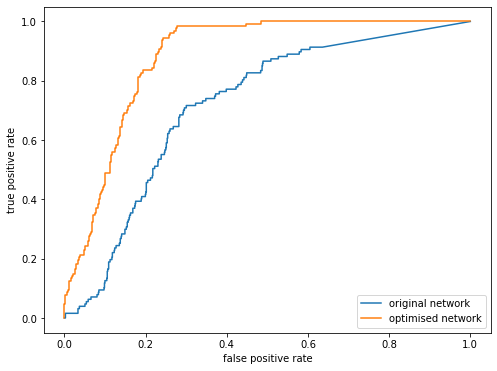

In [97]:
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, label='original network')
plt.plot(fpr2, tpr2, label='optimised network')
plt.xlabel('false positive rate')
plt.ylabel('true positive rate')
plt.legend(loc='best');

SRT: Very good, modulo using the sub-optimal mlp regressor for the classification task. With the classifer, the training score gets to ~0.93.